# Practica Regresió lineal
Som el grup GPA105-0830  
Utilitzem la seguent base de dades: https://www.kaggle.com/uciml/red-wine-quality-cortez-et-al-2009


# Apartat (C): Analitzant Dades

L'objectiu d'aquest primer apartat serà conèixer la base de dades que es té entre mans. S'han d'analitzar els diferents atributs que la composen, entendre'ls i caldrà fixar quin es l'atribut objectiu a predir de tots els que hi ha a la base de dades.


In [1]:
from sklearn.datasets import make_regression
import numpy as np
import pandas as pd
%matplotlib notebook
from matplotlib import pyplot as plt
import scipy.stats

# Visualitzarem només 3 decimals per mostra
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Funcio per a llegir dades en format csv
def load_dataset(path):
    dataset = pd.read_csv(path, header=0, delimiter=',')
    return dataset

# Carreguem dataset d'exemple
dataset = load_dataset('winequality-red.csv')
data = dataset.values

def separar_objectiu(data, objectiu_idx):
    """funcio per a separar el atribut objectiu de les nostres dades"""
    x = np.delete(data, objectiu_idx, axis=1)
    y = data[:, objectiu_idx]
    return x, y

def dividir_train_test(dataset, perc):
    idx = dataset.sample(frac=perc).index

    train_dataset = dataset[dataset.index.isin(idx)]
    test_dataset = dataset[~dataset.index.isin(idx)]
    return train_dataset, test_dataset

# no tenemos objetivo todavia, estamos analizando los datos, luego ejecutar lo de abajo

# El valor 8 fa referencia a l'atribut objectiu del dataset (density)
x, y = separar_objectiu(data, 7)


print("Dimensionalitat de la BBDD:", dataset.shape)
print("Dimensionalitat de les entrades X", x.shape)
print("Dimensionalitat de l'atribut Y", y.shape)

Dimensionalitat de la BBDD: (1599, 12)
Dimensionalitat de les entrades X (1599, 11)
Dimensionalitat de l'atribut Y (1599,)


In [2]:
print("Per comptar el nombre de valors no existents:")
print(dataset.isnull().sum())

Per comptar el nombre de valors no existents:
fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64


No tenim valors nulls de manera que no s'han de treure

### Visualitzem la base de dades

In [3]:
print("Per visualitzar les primeres 5 mostres de la BBDD:")
dataset.head() 

Per visualitzar les primeres 5 mostres de la BBDD:


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.400,0.700,0.000,1.900,0.076,11.000,34.000,0.998,3.510,0.560,9.400,5
1,7.800,0.880,0.000,2.600,0.098,25.000,67.000,0.997,3.200,0.680,9.800,5
2,7.800,0.760,0.040,2.300,0.092,15.000,54.000,0.997,3.260,0.650,9.800,5
3,11.200,0.280,0.560,1.900,0.075,17.000,60.000,0.998,3.160,0.580,9.800,6
4,7.400,0.700,0.000,1.900,0.076,11.000,34.000,0.998,3.510,0.560,9.400,5


In [4]:
print("Per veure estadístiques dels atributs numèrics de la BBDD:")
dataset.describe()

Per veure estadístiques dels atributs numèrics de la BBDD:


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000,1599.000,1599.000,1599.000,1599.000,1599.000,1599.000,1599.000,1599.000,1599.000,1599.000,1599.000
mean,8.320,0.528,0.271,2.539,0.087,15.875,46.468,0.997,3.311,0.658,10.423,5.636
std,1.741,0.179,0.195,1.410,0.047,10.460,32.895,0.002,0.154,0.170,1.066,0.808
min,4.600,0.120,0.000,0.900,0.012,1.000,6.000,0.990,2.740,0.330,8.400,3.000
25%,7.100,0.390,0.090,1.900,0.070,7.000,22.000,0.996,3.210,0.550,9.500,5.000
50%,7.900,0.520,0.260,2.200,0.079,14.000,38.000,0.997,3.310,0.620,10.200,6.000
75%,9.200,0.640,0.420,2.600,0.090,21.000,62.000,0.998,3.400,0.730,11.100,6.000
max,15.900,1.580,1.000,15.500,0.611,72.000,289.000,1.004,4.010,2.000,14.900,8.000


Mirem la correlació entre els atributs d'entrada per entendre millor les dades


<IPython.core.display.Javascript object>


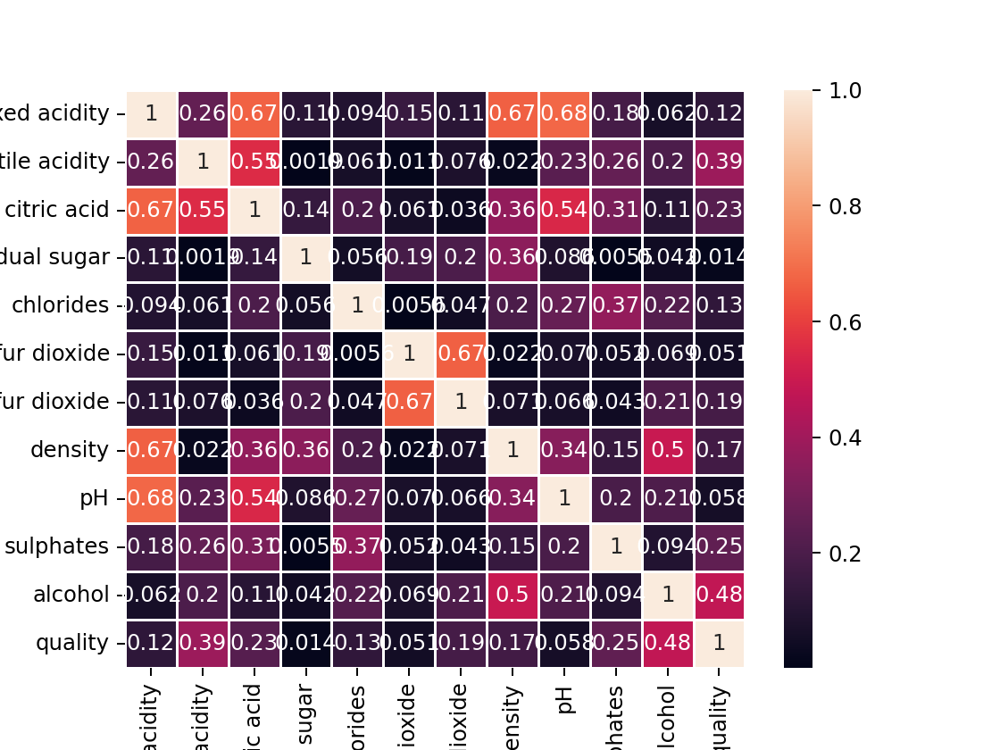

In [5]:
import seaborn as sns

print("Mirem la correlació entre els atributs d'entrada per entendre millor les dades")
correlacio = dataset.corr()

plt.figure()

# apliquem el valor absolut, per diferenciarles millor
ax = sns.heatmap(abs(correlacio), annot=True, linewidths=.5)

Mirem la relació entre atributs utilitzant la funció pairplot


<IPython.core.display.Javascript object>


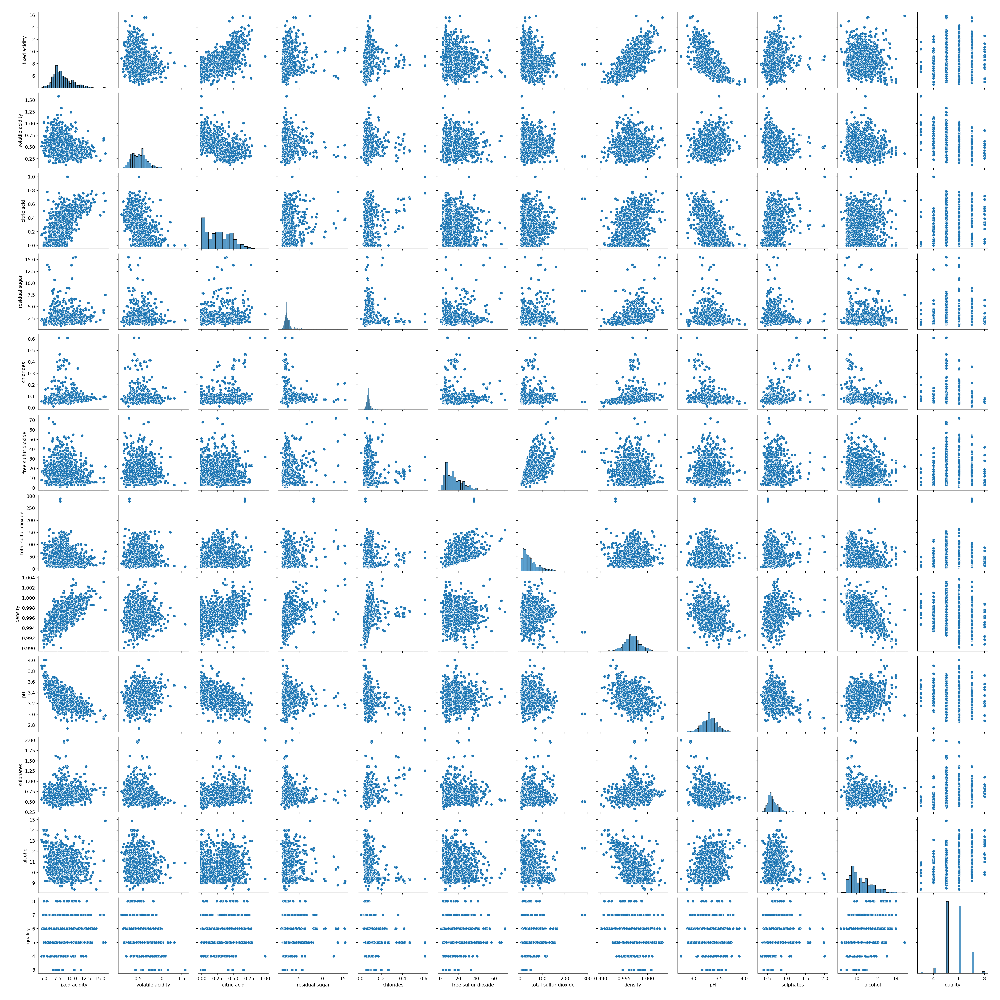

In [6]:
print("Mirem la relació entre atributs utilitzant la funció pairplot")
relacio = sns.pairplot(dataset)

<IPython.core.display.Javascript object>


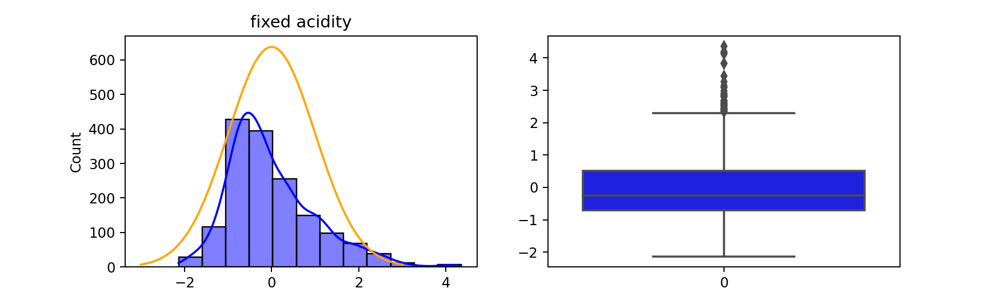

[fixed acidity] : No es distribucio normal


<IPython.core.display.Javascript object>


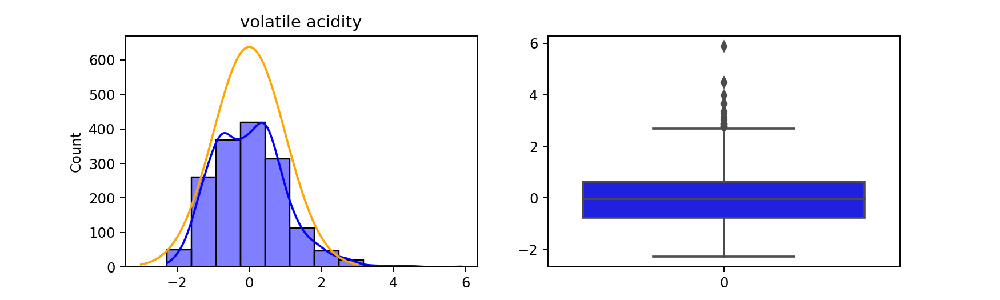

[volatile acidity] : No es distribucio normal


<IPython.core.display.Javascript object>


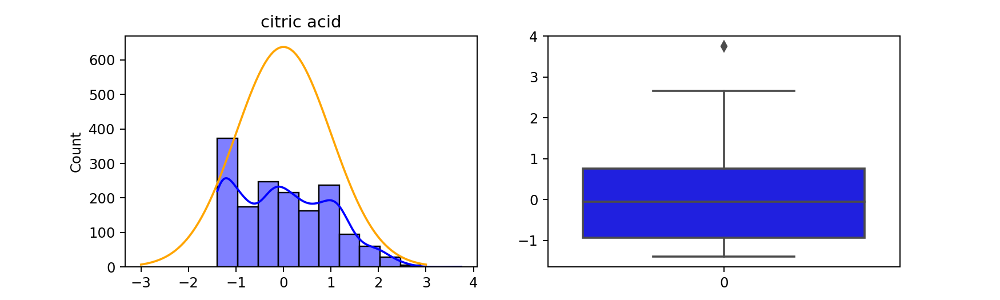

[citric acid] : No es distribucio normal


<IPython.core.display.Javascript object>


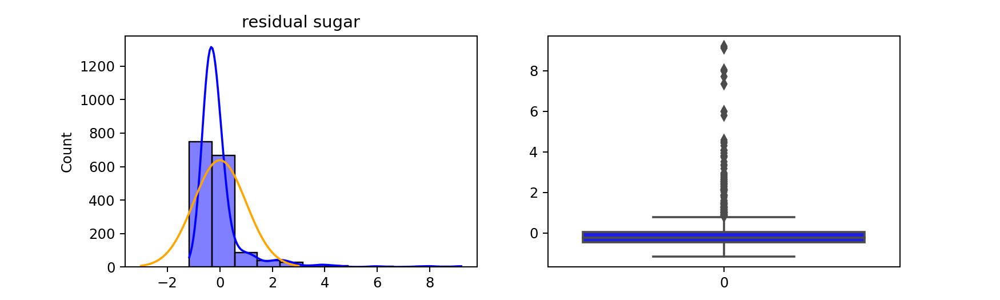

[residual sugar] : No es distribucio normal


<IPython.core.display.Javascript object>


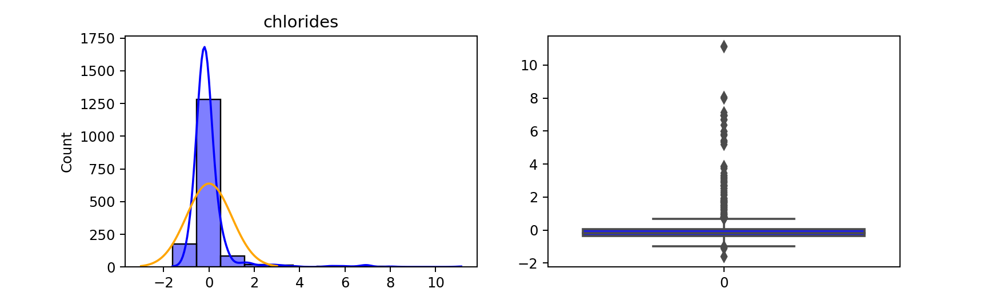

[chlorides] : No es distribucio normal


<IPython.core.display.Javascript object>


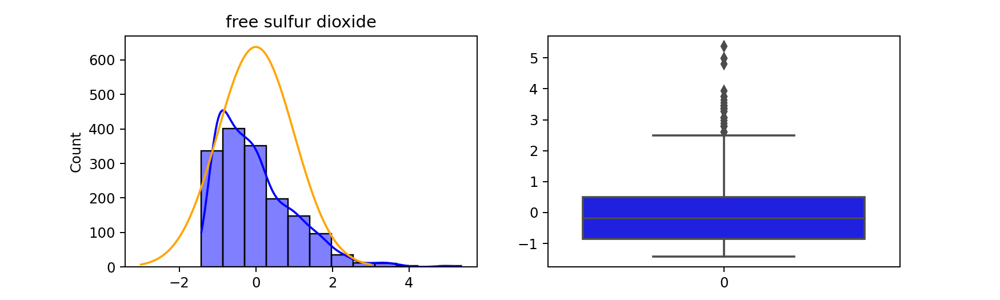

[free sulfur dioxide] : No es distribucio normal


<IPython.core.display.Javascript object>


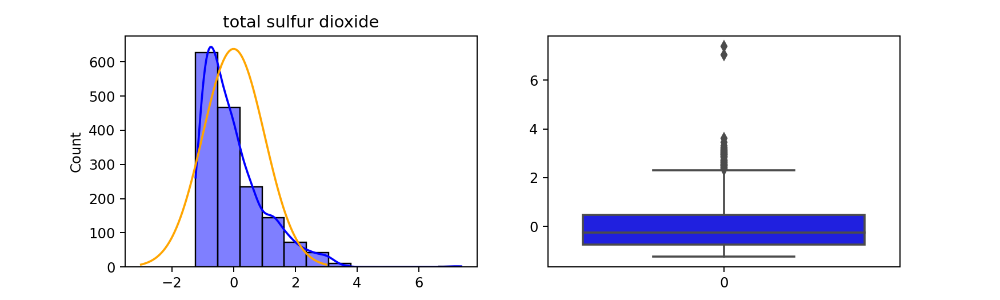

[total sulfur dioxide] : No es distribucio normal


<IPython.core.display.Javascript object>


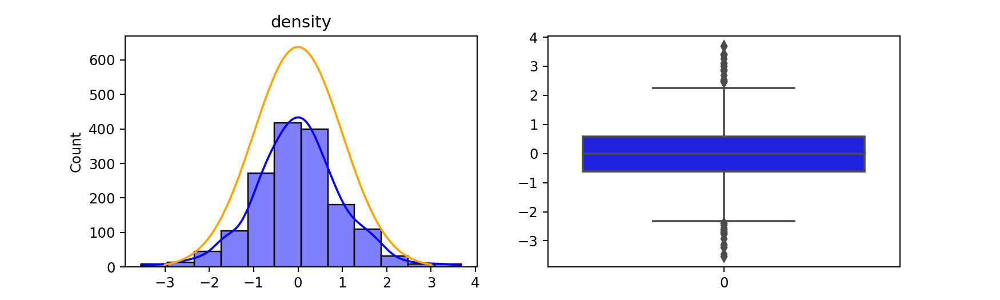

[density] : No es distribucio normal


<IPython.core.display.Javascript object>


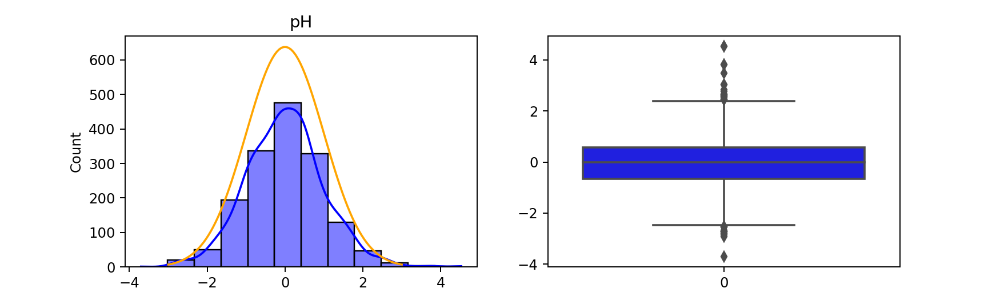

[pH] : No es distribucio normal


<IPython.core.display.Javascript object>


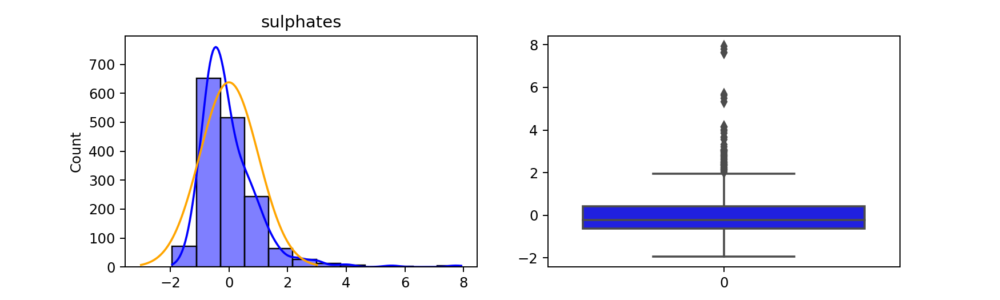

[sulphates] : No es distribucio normal


<IPython.core.display.Javascript object>


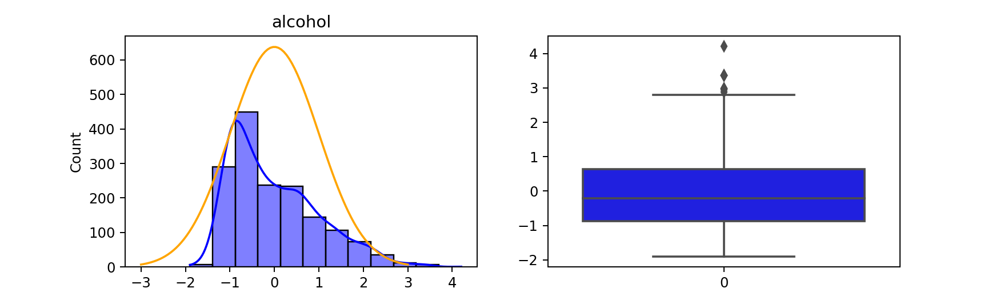

[alcohol] : No es distribucio normal


<IPython.core.display.Javascript object>


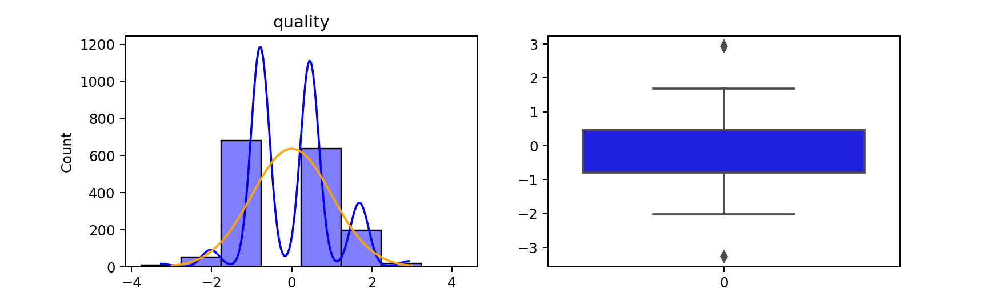

[quality] : No es distribucio normal


In [7]:
#### poner aqui la comprobacion de si una variable tiene distribucion gaussiana ####


def standarize(x, mean=None, std=None):
    if mean is None:
        mean = x.mean(0)
    if std is None:
        std = x.std(0)
    
    return (x - mean[None, :]) / std[None, :], mean, std

def check_gauss_dist(df):
    columns = df.columns
    std_values, mean, std = standarize(df.values)
    
    
    for idx, col in enumerate(columns):

        fig, axes = plt.subplots(1,2, figsize=(10, 3))
        
        
        stat, p = scipy.stats.normaltest(std_values[:, idx])
        alpha = .05
        
#         print(mean[idx], std[idx], stat, p)
        
        if p < alpha:  # null hypothesis: x comes from a normal distribution
            # The null hypothesis can be rejected
            print(f"[{col}] : No es distribucio normal")
        else:
            # The null hypothesis cannot be rejected (comes from a normal dist)
            print(f"[{col}] : Es distribucio normal")
        
        ### visualitzacio

        if idx == 11:
            sns.histplot(x=std_values[:, idx], color='blue', ax=axes[0], discrete=True, kde=True)
        else:
            # bins="sturges" per obtenir un numero de divisions automatiques
            sns.histplot(x=std_values[:, idx], color='blue', ax=axes[0], bins="sturges", kde=True)
        
        
        mu = 0
        variance = 1
        sigma = np.sqrt(variance)
        x = np.linspace(mu - 3*sigma, mu + 3*sigma, 100)
        axes[0].plot(x, scipy.stats.norm.pdf(x, mu, sigma)*df.shape[0], color="orange")

        sns.boxplot(data=std_values[:, idx], color='blue', ax=axes[1])

        axes[0].set_title(col)

        plt.show()
    
check_gauss_dist(dataset)

No hi ha cap parametre que tingui distribucio normal. Aixó es incorrecte ja que es pot veure visualment que el density i el pH haurien de ser distribució normal. Es molt probable que tinguem massa valors outliers que alterin els resultats.  

Utilitzarem la regla del $3\sigma$ per eliminar valors outliers de les possibles distribucions normals

### Eliminació de valors 

<IPython.core.display.Javascript object>


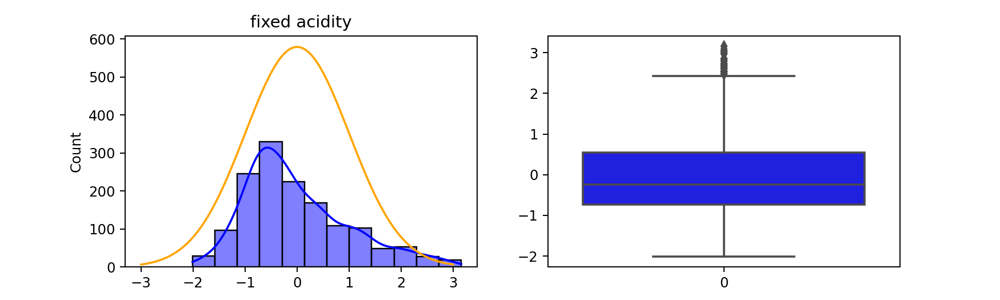

[fixed acidity] : No es distribucio normal


<IPython.core.display.Javascript object>


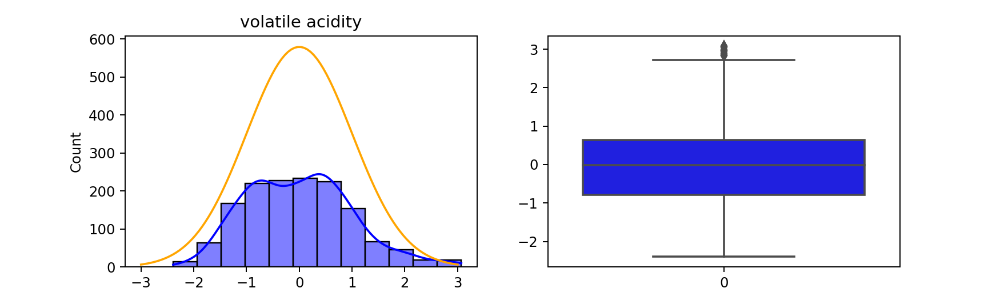

[volatile acidity] : No es distribucio normal


<IPython.core.display.Javascript object>


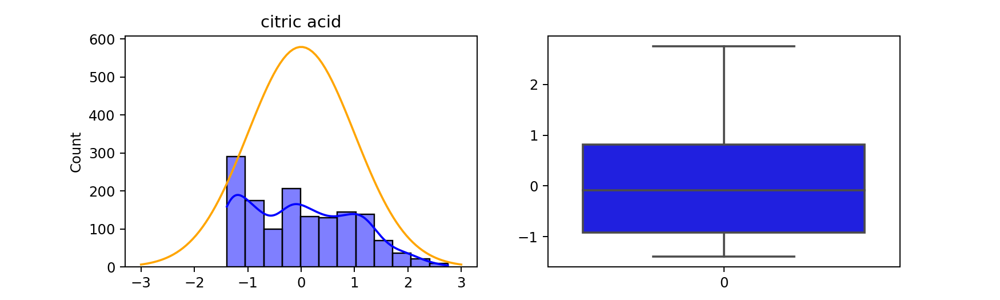

[citric acid] : No es distribucio normal


<IPython.core.display.Javascript object>


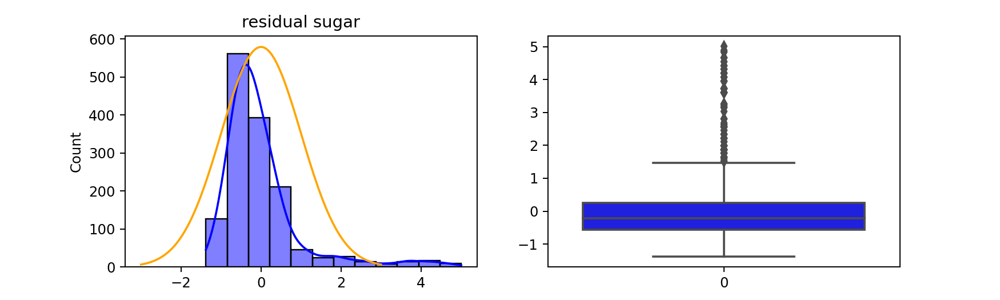

[residual sugar] : No es distribucio normal


<IPython.core.display.Javascript object>


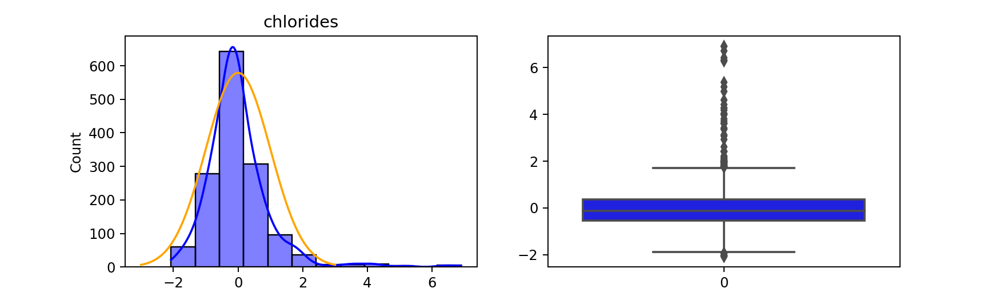

[chlorides] : No es distribucio normal


<IPython.core.display.Javascript object>


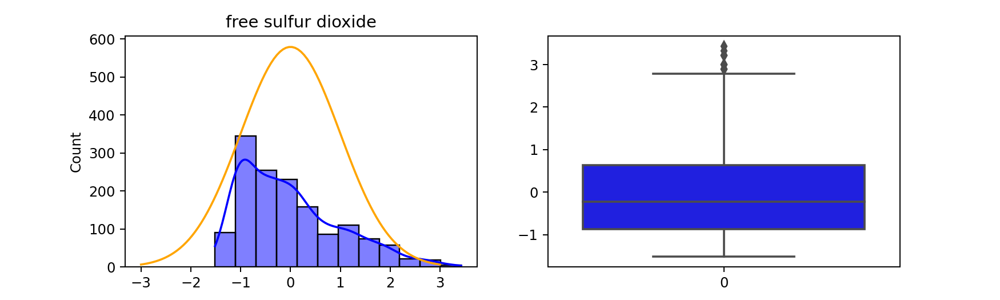

[free sulfur dioxide] : No es distribucio normal


<IPython.core.display.Javascript object>


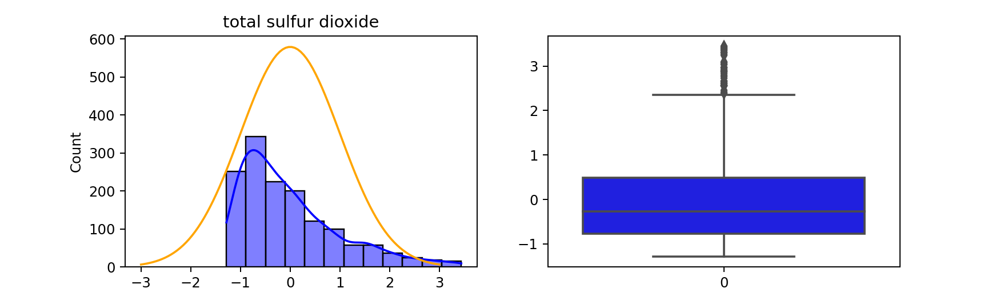

[total sulfur dioxide] : No es distribucio normal


<IPython.core.display.Javascript object>


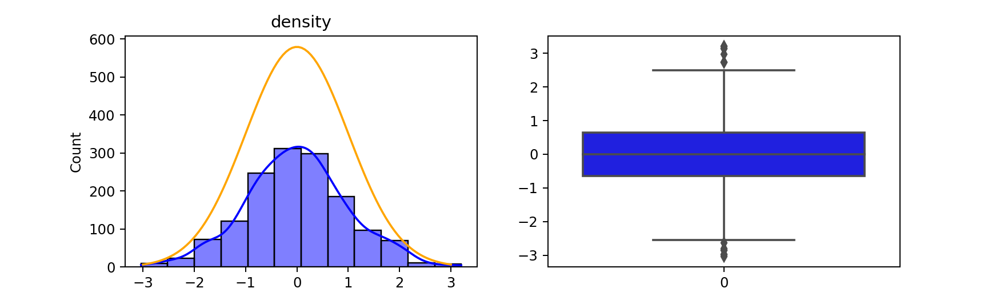

[density] : Es distribucio normal


<IPython.core.display.Javascript object>


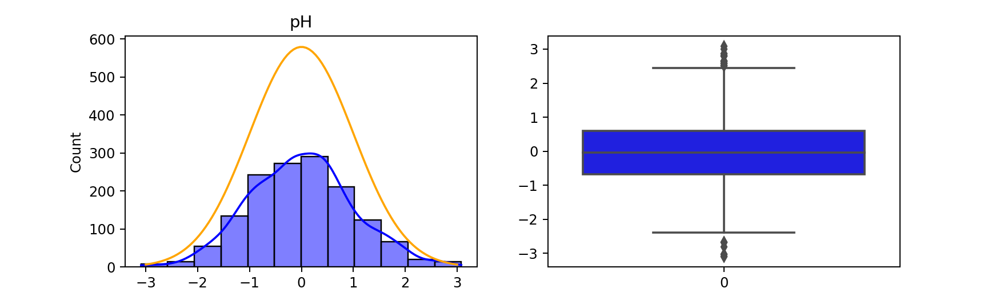

[pH] : Es distribucio normal


<IPython.core.display.Javascript object>


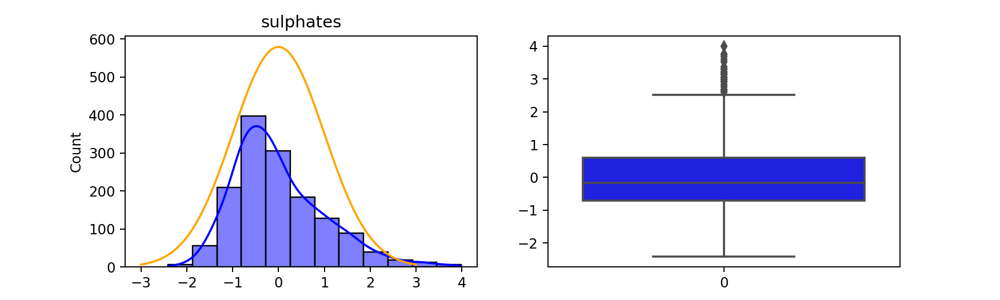

[sulphates] : No es distribucio normal


<IPython.core.display.Javascript object>


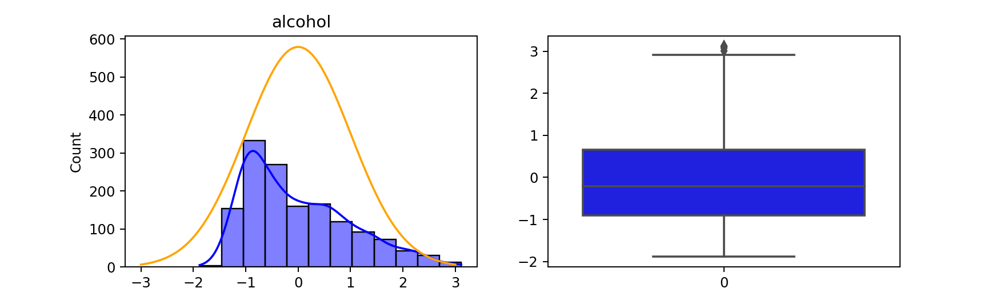

[alcohol] : No es distribucio normal


<IPython.core.display.Javascript object>


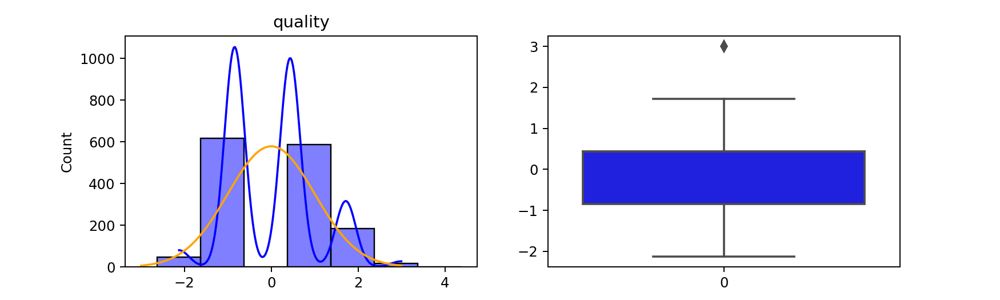

[quality] : No es distribucio normal


In [8]:
#### poner aqui codigo para eliminar valores malos (3sigma) ####

def aplicar_3sigma(dataset):
    columns = dataset.columns
    std_values, mean, std = standarize(dataset.values)
    
    idxs_for_deletion = set()
    
    for idx, line in enumerate(std_values):
        for val in line:
            if abs(val) > 3:
                idxs_for_deletion.add(idx)
    

    return dataset.drop(idxs_for_deletion, axis=0)

# mean = 0
# SD = 1

# one_sd = norm.cdf(SD, mean, SD) - norm.cdf(-SD, mean, SD)
# two_sd = norm.cdf(2 * SD, mean, SD) - norm.cdf(-2 * SD, mean, SD)
# three_sd = norm.cdf(3 * SD, mean, SD) - norm.cdf(-3 * SD, mean, SD)

clean_dataset = aplicar_3sigma(dataset)

check_gauss_dist(clean_dataset)
# new_dataset = dataset.drop([0,1,3,6,9,25], axis=0)
# new_dataset

## Resultats analisi de dades

1. Quin és el tipus de cada atribut?  
    Tots els atributs son continus, menys l'atribut quality que es discret.
2. Quins atributs tenen una distribució Guassiana?  
    density,  
    pH,  
    quality<!--?-->  
    <!--  Este apartado se tendria que cambiar si el codigo de arriba dice lo contrario  -->
3. Quin és l'atribut objectiu? Per què?  
    Farem servir el ..., perque es un valor que té molta correlació amb altres atributs.  
    També farem un estudi a partir del ... ja que encara que no te tanta correlació podria passar que hi
    hagues correlació amb multiples valors.


# Apartat (B): Primeres regresions
Per a aquest primer apartat es calcularà l'error quadràtic mitjà només del regressor per a cada un dels atributs de la base de dades, determinant aquell atribut pel qual l'error quadràtic mitjà (entre el valor predit i el real, per a cada mostra) és més baix.

In [9]:
import math

def mean_squeared_error(y1, y2):
    # comprovem que y1 i y2 tenen la mateixa mida
    assert(len(y1) == len(y2))
    mse = 0
    for i in range(len(y1)):
        mse += (y1[i] - y2[i])**2
    return mse / len(y1)


In [10]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

def regression(x, y):
    # Creem un objecte de regressió de sklearn
    regr = LinearRegression()

    # Entrenem el model per a predir y a partir de x
    regr.fit(x, y)

    # Retornem el model entrenat
    return regr


def comprobar_regresio(regr, x, y):
    predicted = regr.predict(x)
    MSE = mean_squeared_error(y, predicted)
    r2 = r2_score(y, predicted)


    return predicted, MSE, r2


Mean squeared error:  4.066611982540099e-06
R2 score:  -0.004929129950122624


<IPython.core.display.Javascript object>


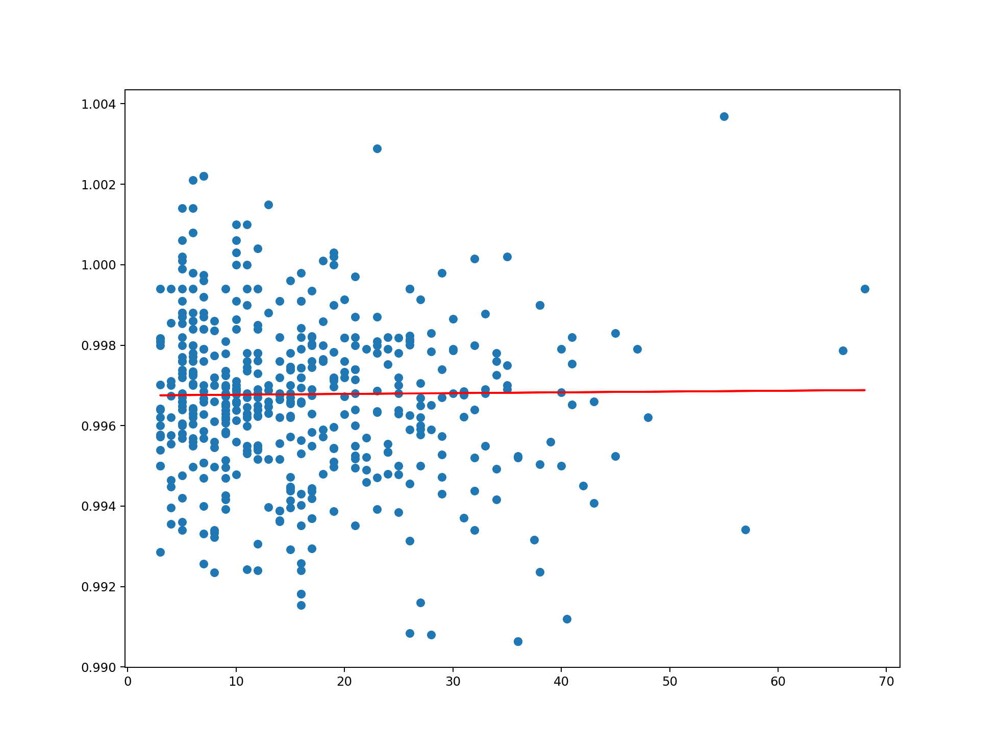

(LinearRegression(), 4.066611982540099e-06, -0.004929129950122624)

In [29]:
def generar_train_test(dataset, objective_parameter):
    # Separem les dades de test i de train
    train_dataset, test_dataset = dividir_train_test(dataset, 0.7)

    # #obtenim x, y (objectiu 7: density)
    train_x, train_y = separar_objectiu(train_dataset.values, objective_parameter)
    test_x, test_y = separar_objectiu(test_dataset.values, objective_parameter)
    
    return train_x, train_y, test_x, test_y


def test_linear_regression(dataset, objective_parameter, chosen_param, graph=True):
    # Separem les dades de test i de train
    train_x, train_y, test_x, test_y = generar_train_test(dataset, objective_parameter)

    regr = regression(train_x[:, chosen_param].reshape(train_x.shape[0], 1), train_y)

    predicted, MSE, r2 = comprobar_regresio(regr, test_x[:, chosen_param].reshape(test_x.shape[0], 1), test_y)
    print("Mean squeared error: ", MSE)
    print("R2 score: ", r2)

    if graph:
        plt.figure()
        ax = plt.scatter(test_x[:, chosen_param], test_y)
        plt.plot(test_x[:, chosen_param].reshape(test_x.shape[0], 1), predicted, 'r')

    return regr, MSE, r2

# fem una linear regresion amb objectiu density, i valor d'entrada residual sugar

test_linear_regression(dataset, 7, 5)

	 fixed acidity :
Mean squeared error:  0.00011454865746401661
R2 score:  -34.754729986343165
	 volatile acidity :
Mean squeared error:  3.745327046215692e-06
R2 score:  -0.005725765672686567
	 citric acid :
Mean squeared error:  3.7267298093421817e-06
R2 score:  0.04113017164052202
	 residual sugar :
Mean squeared error:  5.469058870451416e-06
R2 score:  -0.3804782856281357
	 chlorides :
Mean squeared error:  3.547556323518516e-06
R2 score:  -0.0005303087784660487
	 free sulfur dioxide :
Mean squeared error:  7.977637391844027e-06
R2 score:  -0.9857469028722481
	 total sulfur dioxide :
Mean squeared error:  3.0313094693582947e-05
R2 score:  -7.250172522827441
	 pH :
Mean squeared error:  9.018559893413817e-06
R2 score:  -1.7235988863181713
	 sulphates :
Mean squeared error:  3.979802489242304e-06
R2 score:  -0.013821900638913087
	 alcohol :
Mean squeared error:  9.343641769467817e-05
R2 score:  -26.50921831652359
	 quality :
Mean squeared error:  8.915490830994464e-06
R2 score:  -1.73

<IPython.core.display.Javascript object>


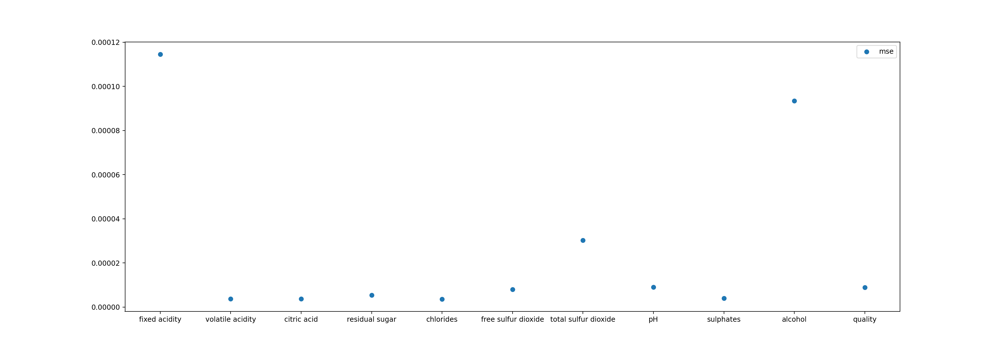

In [32]:
# fem un bucle per comprovar els valors que millor prediuen el valor objectiu

MSEs = []
r2s = []
objectiu_idx = 7
cols = np.delete(dataset.columns, objectiu_idx)

def standarize(x_train):
    mean = x_train.mean(0)
    std = x_train.std(0)
    x_t = x_train - mean[None, :]
    x_t /= std[None, :]
    return x_t

def test_linear_regression_standard(dataset, objective_parameter, chosen_param, graph=True):
    # Separem les dades de test i de train
    train_x, train_y, test_x, test_y = generar_train_test(dataset, objective_parameter)
    
    train_x = standarize(train_x)
    
    regr = regression(train_x[:, chosen_param].reshape(train_x.shape[0], 1), train_y)

    predicted, MSE, r2 = comprobar_regresio(regr, test_x[:, chosen_param].reshape(test_x.shape[0], 1), test_y)
    print("Mean squeared error: ", MSE)
    print("R2 score: ", r2)

    if graph:
        plt.figure()
        ax = plt.scatter(test_x[:, chosen_param], test_y)
        plt.plot(test_x[:, chosen_param].reshape(test_x.shape[0], 1), predicted, 'r')

    return regr, MSE, r2

for i, col in enumerate(cols):
    print("\t", col, ":")
    regr, mse, r2 = test_linear_regression_standard(dataset, objectiu_idx, i, False)
    
    MSEs.append(mse)
    r2s.append(r2)

MSEs = np.array(MSEs)
r2s = np.array(r2s)
plt.figure(figsize=(20,7)) 
plt.scatter(cols, MSEs, label='mse')
#plt.scatter(cols, r2s, label='r2')
plt.legend()
plt.show()



Tambe es pot fer una linear regression amb 2 parametres:

<IPython.core.display.Javascript object>


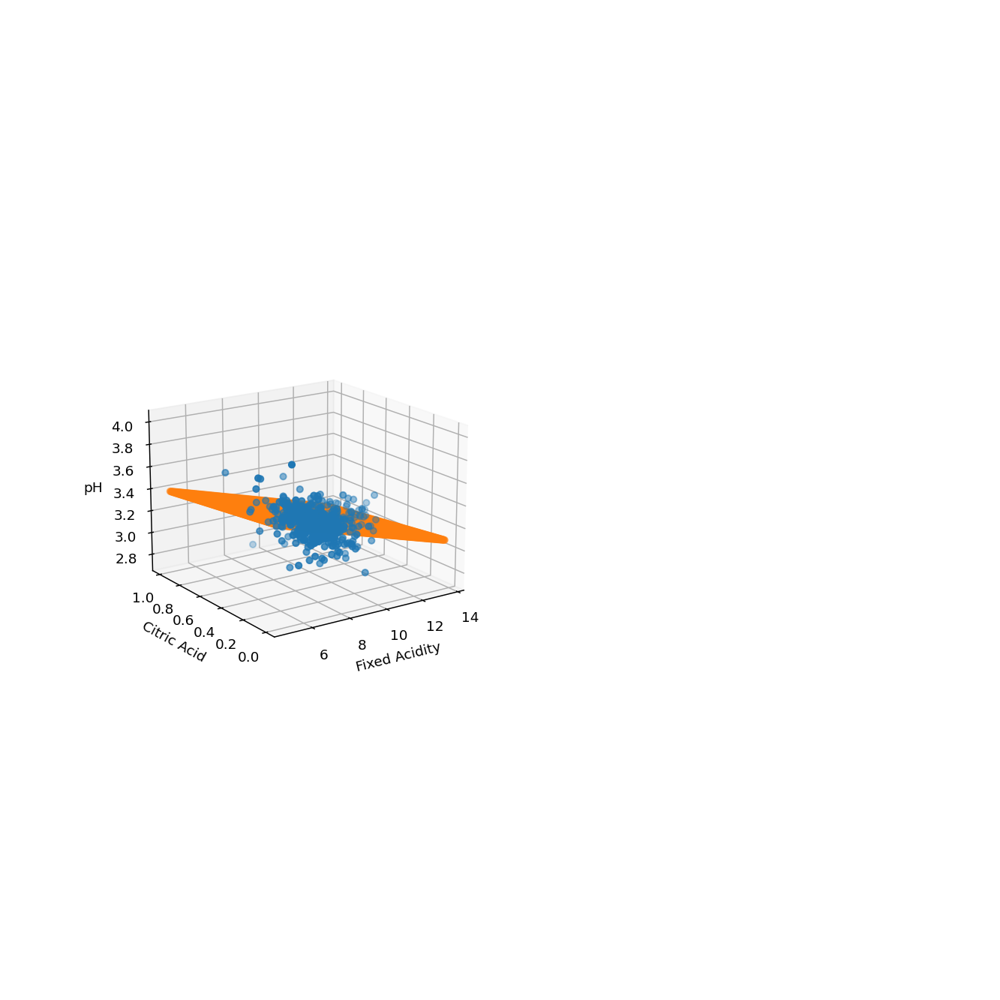

[[ 7.8   0.04]
 [11.2   0.56]
 [ 7.4   0.  ]
 ...
 [ 5.9   0.1 ]
 [ 6.3   0.13]
 [ 5.9   0.12]]
0.4533316607183676 by taking into account fixed acidity and citric acid


In [33]:
f = plt.figure(figsize=(10,10))
ax = f.add_subplot(1, 2, 1, projection='3d')

train_x, train_y, test_x, test_y = generar_train_test(dataset, 8)

linear_model = LinearRegression()    

idxs = [0,2]
print(train_x[:, idxs])
model = linear_model.fit(train_x[:, idxs], train_y)
score = model.score(test_x[:, idxs], test_y)

# plot de los puntos en los 3 ejes: los 2 atributos y el valor real a predecir (y)
ax.scatter(test_x[:, idxs[0]], test_x[:, idxs[1]], test_y)

# creamos una malla de samples sobre las que queremos predecir el valor
x_pred, y_pred = np.meshgrid(
    np.linspace(test_x[:, idxs[0]].min(), test_x[:, idxs[0]].max(), 100),
    np.linspace(test_x[:, idxs[1]].min(), test_x[:, idxs[1]].max(), 100),
)
to_pred = np.array([x_pred.flatten(), y_pred.flatten()]).T

preds_smoke_age = model.predict(to_pred)

# ploteamos todos los puntos que conforman la malla para generar el plano de puntos
ax.scatter(x_pred.flatten(), y_pred.flatten(), preds_smoke_age)

ax.set_xlabel('Fixed Acidity')
ax.set_ylabel('Citric Acid')
ax.set_zlabel('pH')

print(score, "by taking into account fixed acidity and citric acid")